Minimum image and text conditional latent diffusion DDPM training / generation code for personal understaning.  
improved version of `ddpm_text_conditional_unet_t2i2m.ipynb`  

- data : text-image pair dataset `jackyhate/text-to-image-2M`    
- model : simple conditional Unet with time embedding  
- text encoder : pretrained multimodal encoder `sentence-transformers/clip-ViT-B-32-multilingual-v1` (freezed)  
- latent encoder : tiny pretrained vae model `madebyollin/taesdxl`   
- timestep conditionong : applys shift and scale modulate by timesteps to iamge and conditioning image stacked image & adding to image at each Unet blocks  
- text conditioning : fuse image latents with text embedding using cross attention at each Unet layers  


In [5]:
!pip install -q -U datasets einops transformers diffusers autoawq


[notice] A new release of pip is available: 23.1.2 -> 25.0
[notice] To update, run: python3.9 -m pip install --upgrade pip


In [ ]:
# !pip install nvidia-cuda-nvcc-cu11
# !pip install -U triton

In [1]:
from typing import Tuple, Any, List, Dict
import math
import os

import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import matplotlib.pyplot as plt
from fastprogress import progress_bar as pb
from datasets import load_dataset
import transformers
from transformers import AutoTokenizer, AutoModel, CLIPTextModel, DistilBertModel
# from sentence_transformers import SentenceTransformer
import einops
from PIL import Image
from diffusers import AutoencoderTiny

import warnings
warnings.simplefilter('ignore')

os.environ['TOKENIZERS_PARALLELISM'] = 'false'

In [2]:
# Data Config
IMG_SHAPE = (3, 256, 256)
LATENT_IMG_SHAPE = (4, IMG_SHAPE[1]//8, IMG_SHAPE[2]//8) 

USE_CLIP_TEXT_ENCODER = False
TEXT_PADDING_MAX_LENGTH = 150 if not USE_CLIP_TEXT_ENCODER else 77  # clip support only max token length of 77
TEXT_EMB_DIM = 384

# Training Config
EPOCHS = 100
TRAIN_BATCH_SIZE = 32
LR = 1e-4
WEIGHT_DECAY = 1e-2

# Model Config
TIME_EMBEDDING_HIDDEN_SIZE = 1024
TIME_EMBEDDING_FREQ_EMB_SIZE = 1024

# Diffusion Config
STEPS = 1000

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
dtype = torch.float32#torch.bfloat16 if torch.cuda.is_bf16_supported() else torch.float16
use_amp = False
amp_dtype = torch.bfloat16 if torch.cuda.is_bf16_supported() else torch.float16

In [3]:
device, dtype, amp_dtype

(device(type='cuda'), torch.float32, torch.bfloat16)

## 1.1. Load Pretrained Text Encoder

In [4]:
# text_encoder = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2').eval()
# tokenizer = AutoTokenizer.from_pretrained('sentence-transformers/all-MiniLM-L6-v2')
# text_encoder = AutoModel.from_pretrained('sentence-transformers/all-MiniLM-L6-v2').to(device).eval()

# tokenizer = AutoTokenizer.from_pretrained("openai/clip-vit-base-patch32")
# text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-base-patch32", torch_dtype=torch.bfloat16, attn_implementation="sdpa").to(device).eval()

# tokenizer = AutoTokenizer.from_pretrained("sentence-transformers/clip-ViT-B-32-multilingual-v1")
# text_encoder = DistilBertModel.from_pretrained("sentence-transformers/clip-ViT-B-32-multilingual-v1", torch_dtype=torch.float32).to(device).eval()

tokenizer = AutoTokenizer.from_pretrained("Qwen/Qwen2.5-0.5B-Instruct-AWQ")
text_encoder = AutoModel.from_pretrained("Qwen/Qwen2.5-0.5B-Instruct-AWQ", torch_dtype=torch.bfloat16).to(device).eval()

_ = text_encoder.requires_grad_(False)

You have loaded an AWQ model on CPU and have a CUDA device available, make sure to set your model on a GPU device in order to run your model.
We suggest you to set `torch_dtype=torch.float16` for better efficiency with AWQ.
`low_cpu_mem_usage` was None, now default to True since model is quantized.


In [5]:
TEXT_EMB_DIM = text_encoder.config.hidden_size

## 1.2. Load Pretrained Latent Encoder VAE

In [6]:
vae = AutoencoderTiny.from_pretrained("madebyollin/taesdxl", torch_dtype=dtype).eval().to('cuda')
_ = vae.requires_grad_(False)

## 2. Data Pereparation

In [7]:
# data_part_no = 0
# data_part_no = 1
# data_part_no = 2
data_part_no_list = [0, 1, 2]
hf_dataset = load_dataset('jackyhate/text-to-image-2M', trust_remote_code=True, data_files=[f"data_512_2M/data_00000{no}.tar" for no in data_part_no_list], cache_dir='./cache_data')['train']

Loading dataset shards:   0%|          | 0/50 [00:00<?, ?it/s]

In [8]:
hf_dataset

Dataset({
    features: ['__key__', '__url__', 'jpg', 'json'],
    num_rows: 149985
})

In [9]:
hf_dataset[0]['jpg'].size, hf_dataset[0]['json']

((512, 512),
 {'prompt': 'A group of people is gathered under a large tree with green leaves. In the center, a man is wearing a colorful shirt with a yellow and red design and a matching headband. He is standing with his hands pressed together in a prayer gesture. Surrounding him are other individuals, some of whom are also wearing headbands. The group appears to be participating in a ceremony or event.'})

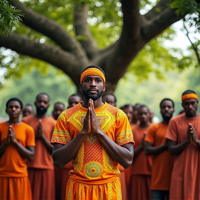

In [10]:
hf_dataset[0]['jpg'].resize((200, 200))

In [11]:
sr_token_counts = pd.Series(hf_dataset['json']).map(lambda x: len(tokenizer(x['prompt'], return_tensors='pt')['input_ids'][0]))

<Axes: ylabel='Frequency'>

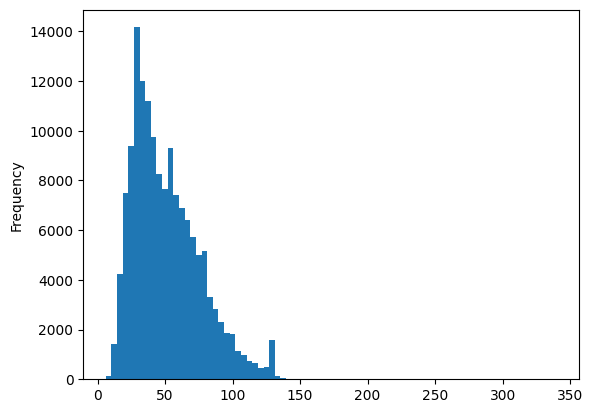

In [12]:
sr_token_counts.plot.hist(bins=80)

In [13]:
image_transforms = torchvision.transforms.Compose(
    [
        torchvision.transforms.Resize(IMG_SHAPE[1:], interpolation=torchvision.transforms.InterpolationMode.BILINEAR),
        torchvision.transforms.CenterCrop(IMG_SHAPE[1:]),
        torchvision.transforms.ToTensor(),
        torchvision.transforms.Normalize([0.5], [0.5]),
    ]
)

In [14]:
@torch.inference_mode()
def encode_text(texts):
    inputs = tokenizer(texts, padding='max_length', max_length=TEXT_PADDING_MAX_LENGTH, truncation=True, return_tensors='pt')
    inputs = {k: v.to(device) for k, v in inputs.items()}
    text_encoder_output = text_encoder(**inputs)
    text_emb = text_encoder_output['last_hidden_state']
    return inputs['attention_mask'].bool(), text_emb

def preprocess_data(examples):
    images = [image.convert("RGB") for image in examples['jpg']]
    images = [image_transforms(image) for image in images]

    examples["pixel_values"] = images
    text_attn_mask, text_emb = encode_text([d['prompt'] for d in examples['json']])
    examples["text_emb"] = text_emb
    examples["text_attn_mask"] = text_attn_mask

    return examples

In [15]:
%%time
hf_dataset = hf_dataset.with_transform(preprocess_data)

CPU times: user 6.92 s, sys: 723 ms, total: 7.64 s
Wall time: 7.65 s


In [16]:
hf_dataset[0].keys()

dict_keys(['__key__', '__url__', 'jpg', 'json', 'pixel_values', 'text_emb', 'text_attn_mask'])

In [17]:
hf_dataset[0]['pixel_values'].shape, hf_dataset[0]['text_emb'].shape, hf_dataset[0]['text_attn_mask'].shape

(torch.Size([3, 256, 256]), torch.Size([150, 896]), torch.Size([150]))

In [18]:
def collate_fn(examples):
    pixel_values = torch.stack([example["pixel_values"] for example in examples])
    pixel_values = pixel_values.to(memory_format=torch.contiguous_format).float()

    text_emb = torch.stack([example["text_emb"] for example in examples])
    text_attn_mask = torch.stack([example["text_attn_mask"] for example in examples])

    return {
        "pixel_values": pixel_values.to(dtype),
        "text_emb": text_emb.to(dtype),
        'text_attn_mask': text_attn_mask,
    }

In [19]:
train_dataloader = torch.utils.data.DataLoader(
    hf_dataset,
    shuffle=True,
    collate_fn=collate_fn,
    batch_size=TRAIN_BATCH_SIZE,
)

In [20]:
_batch = next(iter(train_dataloader))

In [21]:
{k: v.shape for k, v in _batch.items()}

{'pixel_values': torch.Size([32, 3, 256, 256]),
 'text_emb': torch.Size([32, 150, 768]),
 'text_attn_mask': torch.Size([32, 150])}

## 3. Model

In [20]:
# Time Embedder (borrowed from micro diffusion)

class TimestepEmbedder(nn.Module):
    """Embeds scalar timesteps into vector representations.

    Args:
        hidden_size (int): Size of hidden dimension
        act_layer (Any): Activation layer constructor
        frequency_embedding_size (int, 512): Size of frequency embedding
    """
    def __init__(
        self,
        hidden_size: int,
        act_layer: Any = nn.SiLU,
        frequency_embedding_size: int = TIME_EMBEDDING_FREQ_EMB_SIZE
    ):
        super().__init__()
        self.mlp = nn.Sequential(
            nn.Linear(frequency_embedding_size, hidden_size, bias=True),
            act_layer(),
            nn.Linear(hidden_size, hidden_size, bias=True),
        )
        self.frequency_embedding_size = frequency_embedding_size

    @staticmethod
    def timestep_embedding(t: torch.Tensor, dim: int, max_period: int = 10000) -> torch.Tensor:
        """Create sinusoidal timestep embeddings."""
        half = dim // 2
        freqs = torch.exp(
            -math.log(max_period) * torch.arange(
                start=0,
                end=half,
                dtype=torch.float32,
                device=t.device
            ) / half
        )
        args = t[:, None].float() * freqs[None]
        embedding = torch.cat([torch.cos(args), torch.sin(args)], dim=-1)
        if dim % 2:
            embedding = torch.cat([embedding, torch.zeros_like(embedding[:, :1])], dim=-1)
        return embedding

    def forward(self, t: torch.Tensor) -> torch.Tensor:
        t_freq = self.timestep_embedding(t, self.frequency_embedding_size).to(self.dtype)
        return self.mlp(t_freq)

    @property
    def dtype(self) -> torch.dtype:
        return next(self.parameters()).dtype

In [21]:
# TimestepEmbedder(hidden_size=28*28).eval()(torch.arange(0, 1000)).detach().shape

In [22]:
def modulate(x: torch.Tensor, shift: torch.Tensor, scale: torch.Tensor) -> torch.Tensor:
    """Applies modulation to input tensor using shift and scale factors."""
    return x * (1 + scale) + shift

def positionalencoding1d(d_model, length, dtype=dtype):
    """
    :param d_model: dimension of the model
    :param length: length of positions
    :return: length*d_model position matrix
    """
    if d_model % 2 != 0:
        raise ValueError("Cannot use sin/cos positional encoding with "
                         "odd dim (got dim={:d})".format(d_model))
    pe = torch.zeros(length, d_model)
    position = torch.arange(0, length).unsqueeze(1)
    div_term = torch.exp((torch.arange(0, d_model, 2, dtype=torch.float) *
                         -(math.log(10000.0) / d_model)))
    pe[:, 0::2] = torch.sin(position.float() * div_term)
    pe[:, 1::2] = torch.cos(position.float() * div_term)

    return pe.to(dtype)

def patchfy(x):
    """convert image (bs, ch, h, w) to sequential format (bs, h x w, ch)
    x: image tensor of shape (bs, ch, h, w)
    """
    bs, ch, h, w = x.shape
    return einops.rearrange(x, 'b c h w -> b (h w) c')

def unpatchify(x):
    """convert sequential image (bs, h x w, ch) to (bs, ch, h, w)
    x: image tensor of shape (bs, h x w, ch)
    """
    bs, hxw, ch = x.shape
    h = w = int(hxw**0.5)
    return einops.rearrange(x, 'b (h w) c -> b c h w', h=h, w=w)

class PatchEmbed(nn.Module):
    def __init__(self, in_channels, patch_size, embed_dim):
        super(PatchEmbed, self).__init__()
        self.patch_size = patch_size
        self.embed_dim = embed_dim
        self.conv = nn.Conv2d(in_channels, embed_dim, kernel_size=patch_size, stride=patch_size)

    def forward(self, x):
        # 入力画像のパッチ分割と埋め込み
        x = self.conv(x)  # (batch_size, embed_dim, H/patch_size, W/patch_size)
        x = patchfy(x)  # (batch_size, num_patches, embed_dim)
        return x

class ResConv2d(nn.Module):
    def __init__(
        self,
        in_ch: int,
        out_ch: int,
        kernel_size: int = 3,
        padding: int = 1,
        t_emb_dim: int = None,
    ):
        super().__init__()
        self.in_channels = in_ch
        self.out_channels = out_ch
        self.conv = nn.Conv2d(in_ch, out_ch, kernel_size=kernel_size, padding=padding)
        self.skip = nn.Identity() if in_ch == out_ch else nn.Conv2d(in_ch, out_ch, kernel_size=1)
        self.act = nn.GELU()
        self.t_emb_proj = nn.Linear(t_emb_dim, in_ch) if t_emb_dim is not None else None

    def forward(self, x, t_emb = None):
        """
        x: (bs, ch, h, w)
        t_emb: (bs, t_emb_dim)
        """
        x_t = x
        if self.t_emb_proj is not None and t_emb is not None:
            x_t = x_t + self.act(self.t_emb_proj(t_emb)).unsqueeze(-1).unsqueeze(-1)
        return self.act(self.skip(x) + self.conv(x_t))

class CrossAttn2d(nn.Module):
    def __init__(
        self,
        x_ch: int,
        c_dim: int,
        patch_size: int = 2,
        hidden_size: int = None,
        dropout: float = 0.05,
        num_heads: int = 8,
    ):
        super().__init__()
        if hidden_size is None:
            hidden_size = x_ch
        self.x_pacth_embed = PatchEmbed(x_ch, patch_size, hidden_size)
        self.unpatched_upsample = nn.ConvTranspose2d(hidden_size, x_ch, kernel_size=patch_size, stride=patch_size)
        self.c_proj = nn.Linear(c_dim, hidden_size)
        # self.attn = nn.MultiheadAttention(hidden_size, num_heads, dropout=0.0, bias=True, batch_first=True)
        self.act = nn.GELU()
        self.dropout = dropout
        self.norm = nn.LayerNorm(hidden_size)
        self.num_heads = num_heads

    def forward(self, x, c, c_mask = None, x_patch_pos_emb = None):
        """
        x: (bs, x_ch, h, w)
        c: (bs, c_seq_len, c_dim)
        c_mask: (bs, c_seq_len)
        x_patch_pos_emb: (bs, x_max_seq_len, emb_dim)
        """
        c_proj = self.act(self.norm(self.c_proj(c)))  # (bs, c_seq_len, c_dim) => (bs, c_seq_len, hidden_size)
        x_patched = self.act(self.norm(self.x_pacth_embed(x)))  # (bs, x_ch, h, w) => (bs, xpatch_seq_len, hidden_size)
        if x_patch_pos_emb is not None:
            x_patched = x_patched + x_patch_pos_emb[:, :x_patched.shape[1], :x_patched.shape[2]].to(x.device)
        if c_mask is not None:
            c_mask = c_mask.unsqueeze(1).unsqueeze(1)  # (bs, seq_len_c) => (bs, 1(for heads), 1(for seq_len_xpacth), seq_len_c)
        hidden_size = x_patched.shape[-1]
        x_patched = einops.rearrange(x_patched, 'b sl (nh d) -> b nh sl d', nh=self.num_heads, d=hidden_size // self.num_heads)  # (bs, num_heads, x_seq_len, hidden_size_head)
        c_proj = einops.rearrange(c_proj, 'b sl (nh d) -> b nh sl d', nh=self.num_heads, d=hidden_size // self.num_heads)  # (bs, num_heads, c_seq_len, hidden_size_head)
        x_c_fused = F.scaled_dot_product_attention(query=x_patched, key=c_proj, value=c_proj, attn_mask=c_mask, dropout_p=self.dropout, is_causal=False)  # (bs, xpatch_seq_len, hidden_size)
        x_c_fused = einops.rearrange(x_c_fused, 'b nh sl d -> b sl (nh d)', nh=self.num_heads, d=hidden_size // self.num_heads)  # (bs, xpatch_seq_len, hidden_size)

        x_c_fused = self.act(self.norm(x_c_fused))  # (bs, xpatch_seq_len, hidden_size)
        x_c_fused = self.unpatched_upsample(unpatchify(x_c_fused))  # (bs, x_ch, h, w)
        assert x.shape == x_c_fused.shape
        return x + x_c_fused

class DownBlock(nn.Module):
    def __init__(
        self,
        in_ch: int,
        out_ch: int,
        t_emb_dim: int = None,
    ):
        super().__init__()
        self.in_channels = in_ch
        self.out_channels = out_ch
        self.blocks = nn.ModuleList([
            ResConv2d(in_ch=in_ch, out_ch=out_ch, kernel_size=3, padding=1),
            ResConv2d(in_ch=out_ch, out_ch=out_ch, kernel_size=3, padding=1, t_emb_dim=t_emb_dim),
        ])

    def forward(self, x, t_emb=None):
        """
        x: (bs, ch, h, w)
        t_emb: (bs, t_emb_dim)
        """
        for b in self.blocks:
            x = b(x, t_emb) 
        return x  # (bs, in_ch, h, w) -> (bs, out_ch, h, w)

class UpBlock(nn.Module):
    def __init__(
        self,
        in_ch: int,
        out_ch: int,
        t_emb_dim: int = None,
    ):
        super().__init__()
        self.in_channels = in_ch
        self.out_channels = out_ch
        self.blocks = nn.ModuleList([
            ResConv2d(in_ch=in_ch, out_ch=in_ch, kernel_size=3, padding=1, t_emb_dim=t_emb_dim),
            # upsampling
            nn.ConvTranspose2d(in_ch, out_ch, kernel_size=2, stride=2),
            nn.GELU(),
        ])

    def forward(self, x, t_emb=None):
        """
        x: (bs, ch, h, w)
        t_emb: (bs, t_emb_dim)
        """
        for b in self.blocks:
            if isinstance(b, ResConv2d):
                x = b(x, t_emb)
            else:
                x = b(x)
        return x  # (bs, in_ch, h, w) -> (bs, out_ch, 2 x h, 2 x w)

In [23]:
class ConditionalUNet(nn.Module):
    def __init__(
        self,
        in_channels = 4,
        out_channels = 4,
        # enc_dec_channels = (64, 128, 256, 512),
        enc_dec_channels = (224, 448, 672, 896),
        mid_channel = 1024,
        ch_scale = 1.0,
        c_emb_dim = TEXT_EMB_DIM,
        img_shape: Tuple[int, int, int] = LATENT_IMG_SHAPE,  # (ch, h, w)
        dropout = 0.0,
        cross_attention_dim = 1280,
        t_emb_dim: int = TIME_EMBEDDING_HIDDEN_SIZE,
    ):
        super(ConditionalUNet, self).__init__()
        assert len(enc_dec_channels) == 4

        self.t_emb_dim = t_emb_dim
        if ch_scale != 1.0:
            enc_dec_channels = [int(ch_scale * ch) for ch in enc_dec_channels]
            mid_channel = int(ch_scale * mid_channel)

        # エンコーダ部分
        self.enc1 = self.down_block(in_channels, enc_dec_channels[0])
        self.enc1_c_attn = CrossAttn2d(x_ch=enc_dec_channels[0], c_dim=c_emb_dim, patch_size=2, hidden_size=cross_attention_dim, dropout=dropout)
        self.enc2 = self.down_block(enc_dec_channels[0], enc_dec_channels[1])
        self.enc2_c_attn = CrossAttn2d(x_ch=enc_dec_channels[1], c_dim=c_emb_dim, patch_size=2, hidden_size=cross_attention_dim, dropout=dropout)
        self.enc3 = self.down_block(enc_dec_channels[1], enc_dec_channels[2])
        self.enc3_c_attn = CrossAttn2d(x_ch=enc_dec_channels[2], c_dim=c_emb_dim, patch_size=2, hidden_size=cross_attention_dim, dropout=dropout)
        self.enc4 = self.down_block(enc_dec_channels[2], enc_dec_channels[3])
        # self.enc4_c_attn = CrossAttn2d(x_ch=enc_dec_channels[3], c_dim=c_emb_dim, patch_size=2, hidden_size=cross_attention_dim, dropout=dropout)

        # ボトム部分
        self.center = self.down_block(enc_dec_channels[3], mid_channel)
        self.center_c_attn = CrossAttn2d(x_ch=mid_channel, c_dim=c_emb_dim, patch_size=2, hidden_size=cross_attention_dim, dropout=dropout)

        # デコーダ部分
        self.upconv4 = self.up_block(mid_channel, enc_dec_channels[-1])
        # self.upconv4_c_attn = CrossAttn2d(x_ch=enc_dec_channels[-1], c_dim=c_emb_dim, patch_size=2, hidden_size=cross_attention_dim, dropout=dropout)
        self.upconv3 = self.up_block(2 * enc_dec_channels[-1], enc_dec_channels[-2])
        self.upconv3_c_attn = CrossAttn2d(x_ch=enc_dec_channels[-2], c_dim=c_emb_dim, patch_size=2, hidden_size=cross_attention_dim, dropout=dropout)
        self.upconv2 = self.up_block(2 * enc_dec_channels[-2], enc_dec_channels[-3])
        self.upconv2_c_attn = CrossAttn2d(x_ch=enc_dec_channels[-3], c_dim=c_emb_dim, patch_size=2, hidden_size=cross_attention_dim, dropout=dropout)
        self.upconv1 = self.up_block(2 * enc_dec_channels[-3], enc_dec_channels[-4])
        self.upconv1_c_attn = CrossAttn2d(x_ch=enc_dec_channels[-4], c_dim=c_emb_dim, patch_size=2, hidden_size=cross_attention_dim, dropout=dropout)

        # 出力層
        self.final_conv = nn.Conv2d(2 * enc_dec_channels[-4], out_channels, kernel_size=1)

        self._x_pos_emb = positionalencoding1d(max(list(enc_dec_channels) + [1024, cross_attention_dim]), LATENT_IMG_SHAPE[1] * LATENT_IMG_SHAPE[2]).unsqueeze(0)  # (1, max_seq_len, max_dim)
    
    def down_block(self, in_channels, out_channels):
        block = DownBlock(in_ch=in_channels, out_ch=out_channels, t_emb_dim=self.t_emb_dim)
        return block

    def up_block(self, in_channels, out_channels):
        block = UpBlock(in_ch=in_channels, out_ch=out_channels, t_emb_dim=self.t_emb_dim)
        return block

    def forward(self, x, c, c_mask = None, t_emb = None):
        """
        x: image tensor of shape (bs, ch, h, w)
        c: conditional embeddings of shape (bs, seq_len_c, emb_dim)
        c_mask: attention mask for c of shape (bs, seq_len_c)
        t_emb: timestep embeddings of shape (bs, emb_dim)
        """
        # エンコーダ
        enc1 = self.enc1(x, t_emb=t_emb)
        enc1_c_fused = self.enc1_c_attn(enc1, c, c_mask, self._x_pos_emb)
        enc2 = self.enc2(F.max_pool2d(enc1_c_fused, 2), t_emb=t_emb)
        enc2_c_fused = self.enc2_c_attn(enc2, c, c_mask, self._x_pos_emb)
        enc3 = self.enc3(F.max_pool2d(enc2_c_fused, 2), t_emb=t_emb)
        enc3_c_fused = self.enc3_c_attn(enc3, c, c_mask, self._x_pos_emb)
        enc4 = self.enc4(F.max_pool2d(enc3_c_fused, 2), t_emb=t_emb)
        # enc4_c_fused = self.enc4_c_attn(enc4, c, c_mask, self._x_pos_emb)
        enc4_c_fused = enc4

        # ボトム部分
        center = self.center(F.max_pool2d(enc4_c_fused, 2), t_emb=t_emb)
        center_c_fused = self.center_c_attn(center, c, c_mask, self._x_pos_emb)

        # デコーダ
        up4 = self.upconv4(center_c_fused, t_emb=t_emb)
        # up4_c_fused = self.upconv4_c_attn(up4, c, c_mask, self._x_pos_emb)
        up4_c_fused = up4
        up3 = self.upconv3(torch.cat([up4_c_fused, enc4_c_fused], dim=1), t_emb=t_emb)  # skip connection
        up3_c_fused = self.upconv3_c_attn(up3, c, c_mask, self._x_pos_emb)
        up2 = self.upconv2(torch.cat([up3_c_fused, enc3_c_fused], dim=1), t_emb=t_emb)  # skip connection
        up2_c_fused = self.upconv2_c_attn(up2, c, c_mask, self._x_pos_emb)
        up1 = self.upconv1(torch.cat([up2_c_fused, enc2_c_fused], dim=1), t_emb=t_emb)  # skip connection
        up1_c_fused = self.upconv1_c_attn(up1, c, c_mask, self._x_pos_emb)

        # 最終出力
        output = self.final_conv(torch.cat([up1_c_fused, enc1_c_fused], dim=1))  # skip connection
        return output


In [24]:
class DenoiseModel(torch.nn.Module):
    def __init__(
        self,
        img_shape: Tuple[int, int, int] = LATENT_IMG_SHAPE,  # (ch, h, w)
        time_emb_dim: int = TIME_EMBEDDING_HIDDEN_SIZE,
    ):
        super().__init__()
        self._img_shape = img_shape
        self._unet_denoiser = ConditionalUNet()
        self._timestep_embedder = TimestepEmbedder(hidden_size=time_emb_dim)
        self._adaLN_modulation = nn.Sequential(
            nn.GELU(approximate="tanh"),
            nn.Linear(time_emb_dim, 2 * (self._img_shape[0] * 32 * 32), bias=True),
        )
        self._c_pos_emb = positionalencoding1d(TEXT_EMB_DIM, TEXT_PADDING_MAX_LENGTH).unsqueeze(0)  # (1, max_seq_len, max_dim)

    def forward(self, x: torch.Tensor, t: torch.Tensor, c, c_mask = None):
        """Given noisy input image x_t and time t, predict the added noise (x_t - x_t-1).

        Args:
            x (torch.Tensor): input noisy image x_t with shape (bs, ch, h, w)
            t (torch.Tensor): time steps with shape (bs,)
            c (torch.Tensor): conditional embeddings with shape (bs, seq_len_c, emb_dim)
            c_mask (torch.Tensor): attention mask for c with shape (bs, seq_len_c)

        Returns:
            torch.Tensor: Predicted added noise image (x_t - x_t-1) with shape (bs, ch, h, w)
        """
        bs, ch, h , w = x.shape
        assert self._img_shape == (ch, h, w)
        t_emb = self._timestep_embedder(t)  # (bs,) => (bs, time_emb_dim)
        shift, scale = self._adaLN_modulation(t_emb).chunk(2, dim=1)
        shift = F.interpolate(shift.reshape((bs, ch, 32, 32)), size=(h, w), mode='bilinear').reshape(*x.shape)  # (bs, ch x h x w) => (bs, ch, h, w)
        scale = F.interpolate(scale.reshape((bs, ch, 32, 32)), size=(h, w), mode='bilinear').reshape(*x.shape)  # (bs, ch x h x w) => (bs, ch, h, w)
        x_t_fused = modulate(x, shift, scale)  # make x+cond_image conditioned on timesteps
        c = c + self._c_pos_emb.to(c.device)
        added_noise = x - self._unet_denoiser(x_t_fused, c=c, c_mask=c_mask, t_emb=t_emb)
        return added_noise

In [71]:
_denoise_model = DenoiseModel().to(device).to(dtype).eval()
torch.save(_denoise_model.state_dict(), 'denoise_model.pth')
!ls -lh ./denoise_model.pth
!rm ./denoise_model.pth

-rw-r--r-- 1 root root 673M Feb  1 13:01 ./denoise_model.pth


In [61]:
# {name: param.numel() for name, param in _denoise_model.named_parameters() if param.requires_grad}

In [72]:
with torch.inference_mode():
    _out = _denoise_model(
        torch.randn(1, *LATENT_IMG_SHAPE[-3:]).to(device).to(dtype),
        torch.tensor([0.0]).to(device).to(dtype),
        c=torch.randn(1, TEXT_PADDING_MAX_LENGTH, TEXT_EMB_DIM).to(device).to(dtype),
        c_mask=torch.ones(1, TEXT_PADDING_MAX_LENGTH).to(device),
    )
    print(_out.shape)

torch.Size([1, 4, 32, 32])


## 4. DDPM Scheduler Utils

In [25]:
def get_alpha_beta_sigma_scheduler(
    steps: int,
    # noise_beta = (0.5, 1.0),
    noise_beta = (0.0001, 0.02),
    device = device,
    dtype = dtype,
) -> Tuple[torch.Tensor, torch.Tensor]:
    b1, b2 = noise_beta
    beta_scheduler = [b1 + i*(b2-b1)/steps for i in range(steps)]
    alpha_scheduler = [1.0 - beta for beta in beta_scheduler]
    beta_scheduler = torch.tensor(beta_scheduler, device=device, dtype=torch.float32)
    alpha_scheduler = torch.tensor(alpha_scheduler, device=device, dtype=torch.float32)
    alpha_cumprod_scheduler = alpha_scheduler.cumprod(0)
    sigma_scheduler = (beta_scheduler * (1.0 - alpha_cumprod_scheduler.roll(1)) / (1.0 - alpha_cumprod_scheduler)).sqrt()
    sigma_scheduler[0] = 0.0
    return beta_scheduler.to(device), alpha_scheduler.to(device), alpha_cumprod_scheduler.to(device), sigma_scheduler.to(device)

In [26]:
beta_scheduler, alpha_scheduler, alpha_cumprod_scheduler, sigma_scheduler = get_alpha_beta_sigma_scheduler(steps=STEPS, noise_beta=(0.0001, 0.02))

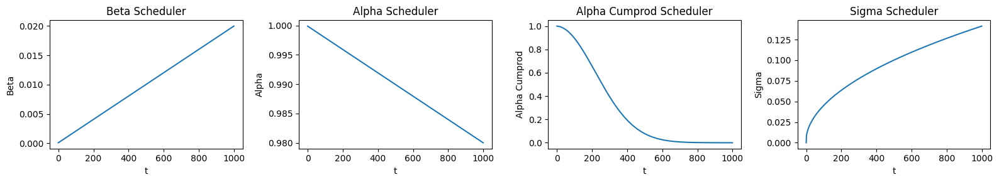

In [27]:
fig, axes = plt.subplots(ncols=4, nrows=1, figsize=(4*4, 3))

axes[0].plot(beta_scheduler.cpu().float().numpy())
axes[0].set_xlabel('t')
axes[0].set_ylabel('Beta')
axes[0].set_title('Beta Scheduler')

axes[1].plot(alpha_scheduler.cpu().float().numpy())
axes[1].set_xlabel('t')
axes[1].set_ylabel('Alpha')
axes[1].set_title('Alpha Scheduler')

axes[2].plot(alpha_cumprod_scheduler.cpu().float().numpy())
axes[2].set_xlabel('t')
axes[2].set_ylabel('Alpha Cumprod')
axes[2].set_title('Alpha Cumprod Scheduler')

axes[3].plot(sigma_scheduler.cpu().float().numpy())
axes[3].set_xlabel('t')
axes[3].set_ylabel('Sigma')
axes[3].set_title('Sigma Scheduler')

fig.tight_layout()

## 5. Denoise(generation) / Add Noise Utils

- Denoise (For Generation)

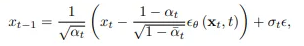

Following above equations, apply denoising process step by step to generate final image $x_0$ starting from pure noise $x_{t_{max}} \sim \mathcal{N}(0,\,1)$, where  
$\alpha_t=1-\beta_t$  
$\overline{\alpha}_{t} = \prod \alpha_t = \prod (1-\beta_t)$  
$ \sigma_{t}^2 = \frac{1.0 - \overline{\alpha}_{t-1}}{1.0 - \overline{\alpha}_{t}}\beta_t$  
$\epsilon_{\theta}(\boldsymbol{x}_{t}, t)$ : model output (predicted noise added to $x_t$)  
$\epsilon \sim \mathcal{N}(0,\,1)$


In [28]:
@torch.inference_mode()
def generate(
    denoise_model: nn.Module,
    texts: List[str],
    img_shape: Tuple[int, int, int] = LATENT_IMG_SHAPE,
    steps: int = STEPS,
    beta_scheduler: torch.Tensor = beta_scheduler,
    alpha_scheduler: torch.Tensor = alpha_scheduler,
    alpha_cumprod_scheduler: torch.Tensor = alpha_cumprod_scheduler,
    sigma_scheduler: torch.Tensor = sigma_scheduler,
    debug: bool = False,
    device = device,
    return_only_final_image: bool = True,
    dtype = dtype,
) -> torch.Tensor:
    denoise_model.eval()
    # create initial pure noise x_tmax
    text_attn_mask, text_emb = encode_text(texts)
    bs = len(texts)
    z_t = init_noise = torch.randn(bs, *img_shape).to(device).to(dtype)
    x_t_list = [vae.decode(z_t).sample / vae.config.scaling_factor] if not return_only_final_image else None
    with torch.autocast(device_type="cuda", dtype=amp_dtype, enabled=use_amp):
        for t in reversed(range(1, steps)):
            # predict noise to denoise from x_t
            pred_noise = denoise_model(
                z_t,
                torch.tensor([t]).repeat((bs,)).to(device).to(dtype),
                c=text_emb.to(device).to(dtype),
                c_mask=text_attn_mask.to(device),
            )
            # apply denoise equation above
            z_prev_t = z_t - pred_noise * (1 - alpha_scheduler[t]) / ((1 - alpha_cumprod_scheduler[t]).sqrt())
            z_prev_t /= alpha_scheduler[t].sqrt()
            z_prev_t += sigma_scheduler[t] * torch.randn_like(z_prev_t)
            z_t = z_prev_t
            if not return_only_final_image:
                x_t_list.append(vae.decode(z_t).sample / vae.config.scaling_factor)

    if return_only_final_image:
        x_0 = vae.decode(z_t).sample / vae.config.scaling_factor  # generated image x_0  (n_generate, ch, h, w)
    else:
        x_0 = torch.stack(x_t_list, dim=0)  # (steps, n_generate, ch, h, w)
    return x_0

In [45]:
gen_img = generate(_denoise_model, texts=[hf_dataset[0]['json']['prompt']])
print(gen_img.shape)

torch.Size([1, 3, 256, 256])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.1867256..4.0907235].


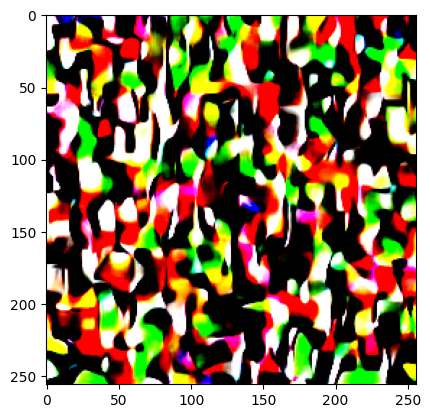

In [46]:
plt.imshow(gen_img[0].cpu().permute(1, 2, 0).float())

- Add Noise (For Training)

image.png

In [29]:
def add_noise(
    x_0: torch.Tensor,
    steps: int = STEPS,
    alpha_cumprod_scheduler: torch.Tensor = alpha_cumprod_scheduler,
    dtype = dtype,
) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor]:
    """Add noise corresponding to random time steps to ground-truth image x_0 to get x_t_rand

    Args:
        x (torch.Tensor): input ground-trueth image x_0 with shape (bs, ch, h, w)

    Returns:
        Tuple[torch.Tensor, torch.Tensor, torch.Tensor]: noised added image x_t_rand, added noise, random timestepps correponsing to added noise
    """
    bs, ch, h, w = x_0.shape
    random_timesteps = torch.randint(0, steps, (bs,)).to(x_0.device)
    alpha_prod = alpha_cumprod_scheduler[random_timesteps].reshape((bs, 1, 1, 1))

    noise = torch.randn_like(x_0)#.to(dtype)
    x_noisy = x_0 * alpha_prod.sqrt() + noise * (1 - alpha_prod).sqrt()
    return x_noisy, noise, random_timesteps

In [ ]:
_x_noisy, _noise, _random_timesteps = add_noise(next(iter(train_dataloader))['pixel_values'].to(device).to(dtype))
print(_x_noisy.shape, _noise.shape, _random_timesteps.shape)

## 6. Run Training

In [30]:
def batch_to_device(batch: Dict[str, torch.Tensor], device: torch.device) -> Dict[str, torch.Tensor]:
    return {k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in batch.items()}

In [31]:
model = DenoiseModel().to(device).to(dtype)
# model.load_state_dict(torch.load('./denoise_model_vaele_tmp.pt'))

optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)

scheduler = transformers.get_cosine_schedule_with_warmup(
    optimizer,
    num_warmup_steps=3*len(train_dataloader),
    num_training_steps=2*EPOCHS*len(train_dataloader),
)

scaler = torch.amp.GradScaler(device='cuda', enabled=use_amp)

epoch 0 : loss 0.23219779133796692
A detailed map of Texas showing toll roads and toll bridges. The map is divided into sections with various colors indicating different types of roads and bridges. There are numerous toll roads and bridges marked with green dots and lines, and the map also includes a legend explaining the different colors and symbols used. The map is overlaid with a grid pattern, and the state of Texas is outlined in a darker shade.
A woven rug with a complex pattern of interlocking geometric shapes in various shades of gray and beige is laid out on a wooden floor.
Two individuals, one a woman in medieval garb and another a man with chainmail, stand before a quaint wooden house, while holding a stuffed dog toy with a numeral '872'.


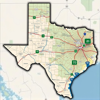

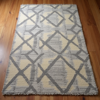

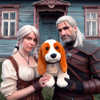

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.42465723..1.2996069].


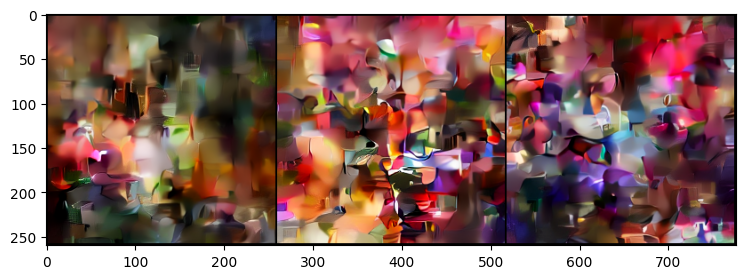

[3.3333333333333335e-05]


epoch 1 : loss 0.1802501678466797
A person is wearing a grey sweatshirt and white pants with a black sneaker.
An animated, bald figure, dressed like a coach, eats a chocolate bar while standing atop a skyscraper, with a busy cityscape below; a yellow helicopter hovers nearby, possibly covered in chocolate splatters.
An animated young character sits pondering on a wooden porch of a rustic house with a thatched roof, flanked by a warm golden light from the setting sun.


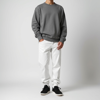

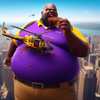

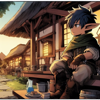

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.63410115..1.733688].


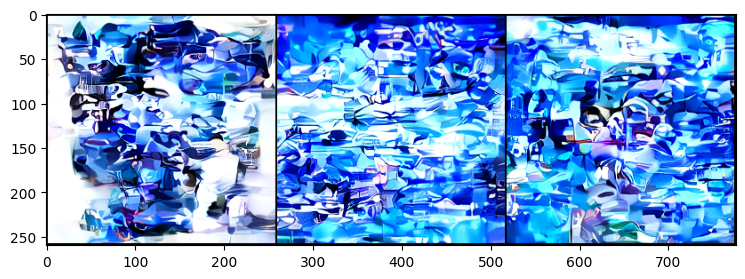

[6.666666666666667e-05]


epoch 2 : loss 0.1687481701374054
The second image is a close-up of the 'Merry Christmas' sign from the first image. It features the word 'JANE' in large, bold letters with a green background. The image is centered around the word 'JANE', with the 'Merry Christmas' text and the Christmas tree in the background. The image is cropped tightly around the word 'JANE', with no other elements visible.
A colorful floral patterned jacket with a zipper and a pink trim at the collar and cuffs. The jacket is predominantly red with a mix of blue, yellow, and orange flowers, and it has a white background. The zipper is silver, and there is a small tag attached to the zipper pull.
A copper-colored tea strainer with a wooden handle is displayed against a dark background.


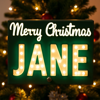

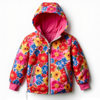

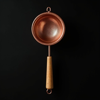

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.17533374..1.1319354].


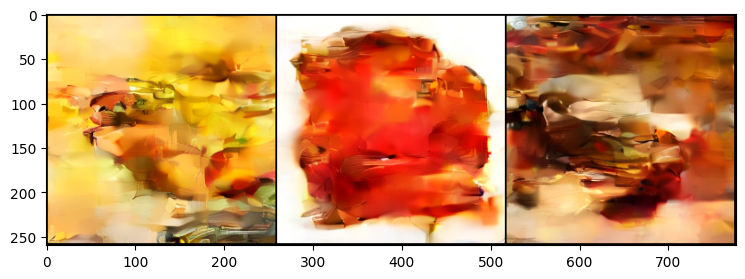

[0.0001]


epoch 3 : loss 0.16084203124046326
A blindfolded woman with short white hair, dressed in a black outfit with floral patterns, holds a sword with a red handle in a post-apocalyptic cityscape with dilapidated buildings and debris.
An enchanted forest scene features an old tree entwined with its roots, hosting a ghostly apparition nearby, amid verdant foliage and babbling brooks.
A person's hand is reaching for a spoon that is resting on a wooden table. The table is covered with a beige cloth and has a bowl of soup, a bowl of chips, a small bowl of salsa, and a small bowl of lime wedges. There is also a spoon on the table.


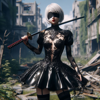

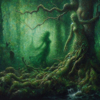

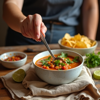

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11874139..1.0947993].


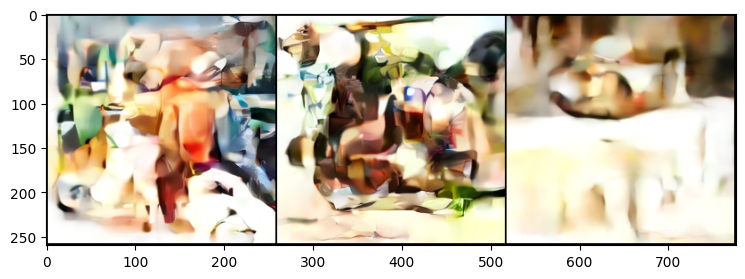

[9.999364232830052e-05]


epoch 4 : loss 0.15695613622665405
A close-up image of a white frisbee with a red logo and text. The logo is stylized with a red 'D' and the text reads 'DACKER' in red with 'Latitude 64' written in smaller text above it. The frisbee has a Zero-Gravity stamp on the bottom edge.
A gingerbread house with a '1 Day Until Christmas' sign is surrounded by a Christmas tree and festive gingerbread treats.
A brown and white bird with a long beak is perched on a dry, brown reed. The bird has a detailed feather pattern with shades of brown, white, and black. The background is a clear blue sky.


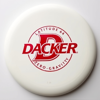

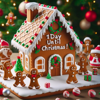

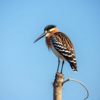

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.15530849..1.1247761].


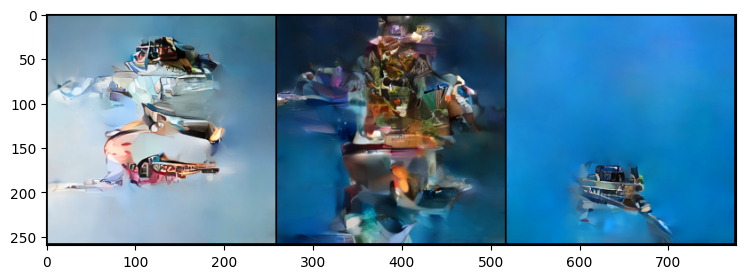

[9.997457093000164e-05]


epoch 5 : loss 0.1551758348941803
A woman in a brown dress with a feathered headdress and a necklace stands in a forest, holding a spear in her right hand. She has a tattoo on her left arm and is wearing a necklace with a pendant. A brown dog is standing to her right, looking towards her.
In a darkened cavern, a surprised young man with blonde hair faces a horde of big-eyed, toothy goblins amid boulder-strewn floors.
A close-up of a textured stone wall with a green leaf symbol on the right side.


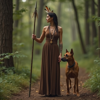

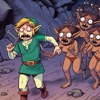

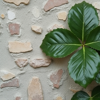

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.17126608..1.145987].


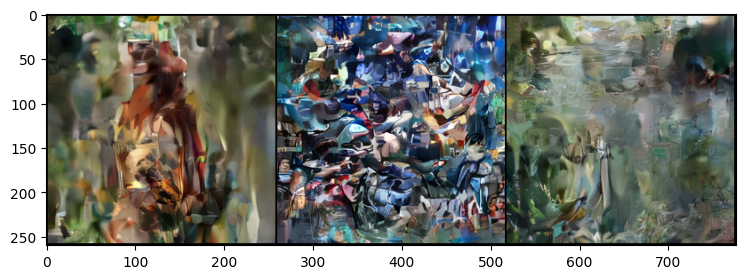

[9.994279065509093e-05]


epoch 6 : loss 0.15215517580509186
A close-up image of a black leather belt with a silver buckle. The buckle is ornate with a circular design and a chain-like pattern. The belt is positioned vertically in the frame, and the background is a plain white color.
A pink bean bag chair with a white Mickey Mouse design on the backrest and a matching white pillow with a pink polka dot pattern.
A modern digital phone with a sleek design, featuring a digital display showing the time and date, a numeric keypad, and a variety of function buttons such as 'Flash', 'Mute', and 'Volume'. The phone has a silver and black color scheme, and the brand name 'Vector' is visible at the bottom.


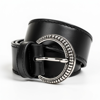

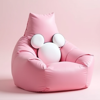

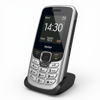

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10025853..1.130987].


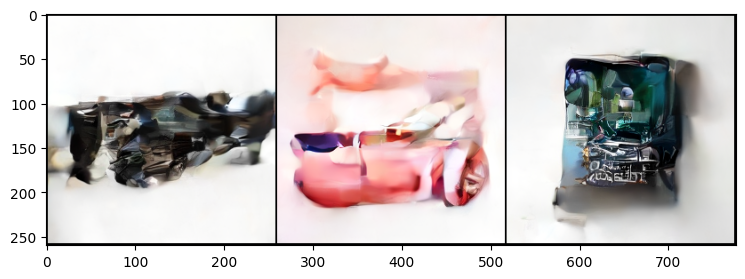

[9.989830958551057e-05]


epoch 7 : loss 0.15017485618591309
A regal woman dressed in Rococo attire sits in a lush garden, holding a golden object and attended by a cherubic figure.
A large, metallic lobster sculpture with a shiny surface is tied with yellow ropes. The sculpture is placed on a wooden surface with visible knots and grain patterns. The lobster has multiple legs and claws, and its body is shaped like a traditional lobster. The ropes are wrapped around the lobster's body and legs, securing it in place.
A certificate with a pink background featuring a portrait of a woman with a large afro hairstyle. The certificate has a decorative border and includes text at the top and bottom, with a signature at the bottom right corner. The text is in a cursive script and appears to be in a foreign language.


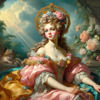

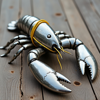

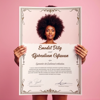

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07856166..1.0906637].


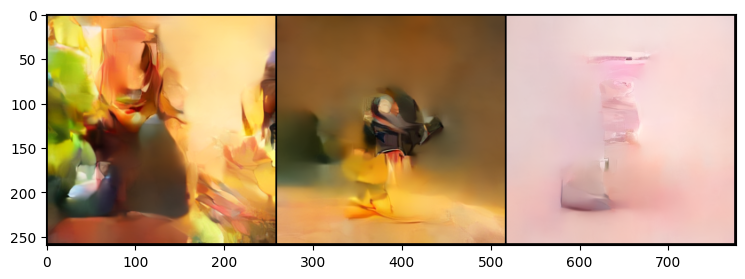

[9.984113903310206e-05]


epoch 8 : loss 0.1492142528295517
A plate of shrimp with a sweet and sour sauce, garnished with green onions and sesame seeds. The shrimp are cooked and appear to be a mix of breaded and plain, with some pieces having a golden-brown color. The sauce is a combination of orange and white, with a glossy finish. The plate is on a blue surface, and there is a microwave in the background.
A man with glasses and a beard is holding a small orange object in his hands. He appears to be examining it closely. The man is wearing a grey sweater and is seated in a room with a window in the background. There are several yellow sticky notes on the wall behind him.
A vintage movie poster for 'The Man With the Golden Gun' features James Bond aiming a golden gun, set against a red and white background with yellow text.


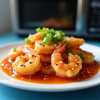

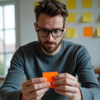

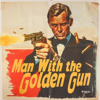

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.17813015..1.1683966].


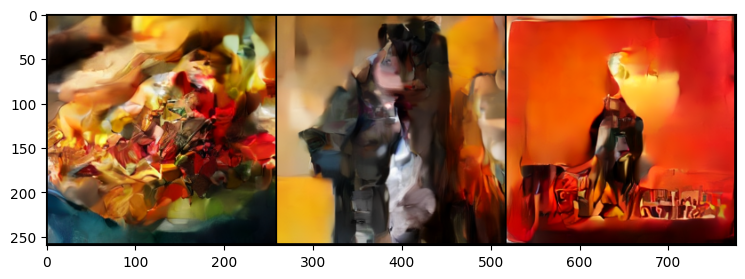

[9.97712935367295e-05]


epoch 9 : loss 0.148274227976799
A silver cross with a golden center and a diamond on the top, attached to a silver chain.
A woman with a mohawk and goggles surveys a cityscape from a high vantage point, radiating determination and focus.
A close-up of a field of tall grasses with a warm, golden hue, suggesting a sunset or sunrise. The grasses are in various shades of pink, purple, and orange, with some appearing to be in motion, as if they are gently swaying in the breeze. The background is softly blurred, emphasizing the foreground of the grasses.


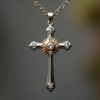

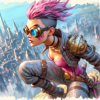

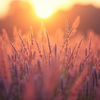

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.16447616..1.2475297].


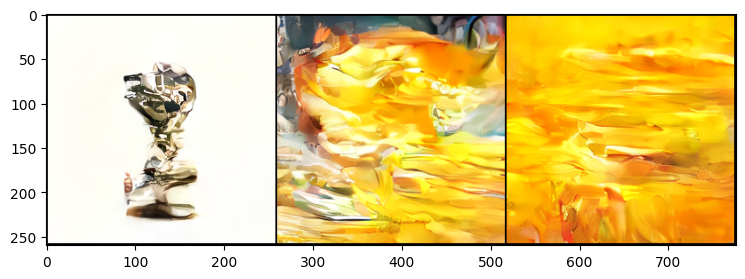

[9.968879085858234e-05]


epoch 10 : loss 0.14666734635829926
A soldier in a World War I trench crouches, possibly in distress, amidst other soldiers and sandbags.
A restaurant interior with a wooden table in the foreground, adorned with a blue balloon with the number '50' on it. The table is surrounded by chairs, and there are more balloons of various colors and sizes floating around the room. The walls are adorned with framed pictures, and there is a clock on the wall. The room has a cozy and celebratory atmosphere.
A set of three golf balls with a black and white logo on them, displayed in a plastic case with a blue background. The balls are placed in a triangular formation, with the logo facing upwards. The case has a clear plastic window that allows the balls to be seen, and the packaging includes a tag with the words 'Three Ball Gift Set' and 'Linkswalker'.


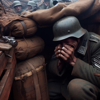

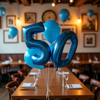

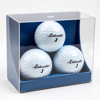

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06522429..1.1042483].


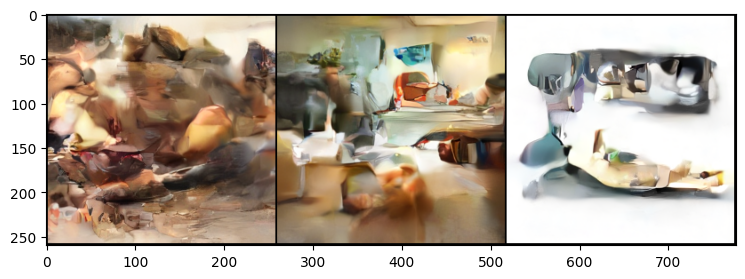

[9.959365197965824e-05]


epoch 11 : loss 0.1467827409505844
A wooden cuckoo clock with a traditional design, featuring a bird figurine on top, a pendulum, and various animal figurines such as deer and a pig. The clock has a white face with Roman numerals and a chain hanging down. The background is a plain wall.
The first image displays a book cover titled 'Bluetooth v2.1 - A New Security Infrastructure and New Vulnerabilities' by Andrew Lound. The cover features a red and white color scheme with a red Bluetooth logo in the top left corner. The title and author name are prominently displayed in the center, with a smaller subtitle below. The background is a plain white color, and there are no other visible elements on the cover.
A sleek silver laptop with a black HP logo on the lid is open, displaying its keyboard and touchpad.


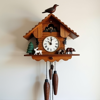

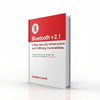

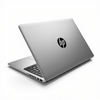

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.081703305..1.1191254].


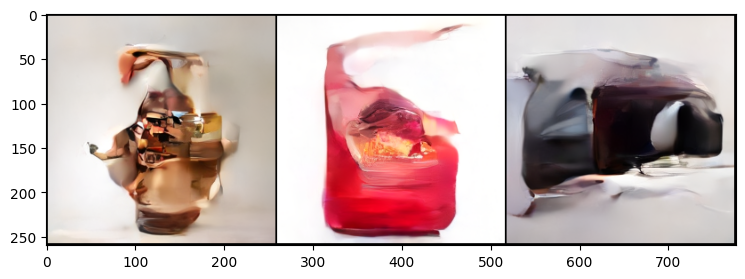

[9.948590109442754e-05]


epoch 12 : loss 0.14480532705783844
A silver wristwatch with a blue dial and black hands is displayed against a white background.
An illustration features a young, sailor-uniformed girl with vibrant green eyes, set against a soft pink and white background with abstract patterns.
Anthropomorphic cat-like figure with mechanical detailing and an armored suit stands amidst a futuristic cityscape lit with neon hues.


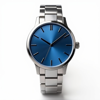

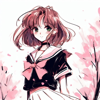

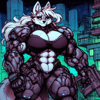

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.15178639..1.184176].


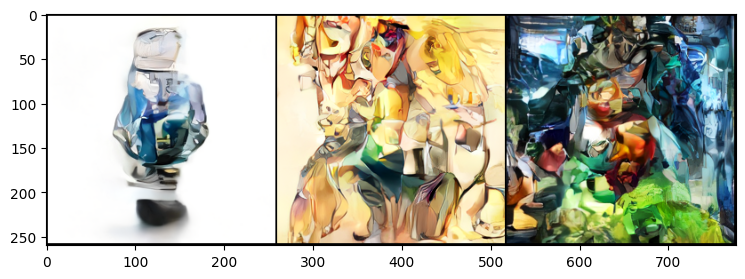

[9.936556560468037e-05]


epoch 13 : loss 0.14434275031089783
A modern bathroom with a glass shower stall, a white robe hanging on the door, and a yellow flower in a vase on the shower floor.
A bottle of 'Colorscience Brightening Perfection Prime Broad Spectrum SPF 30' sunscreen with a silver cap and a teal label. The sunscreen is designed to provide broad-spectrum protection against UVA and UVB rays while also brightening the skin tone. The label features the brand name 'Colorscience' and the product name 'Brightening Perfection Prime'. The sunscreen is described as 'water-resistant for up to 80 minutes' and is suitable for all skin types.
The second image is a graphic novel cover that features a red and black color scheme with a stylized illustration of a forest scene. The title 'BLOOD LIKE GARNETS' is prominently displayed in large, bold letters across the top of the cover. Below the title, there is a smaller text that reads 'HUNTING THE HUNTERS' and 'BY LEIGH HARLEEN'. The cover art includes a variety of el

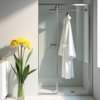

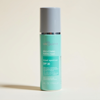

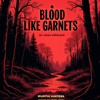

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.17007113..1.1270595].


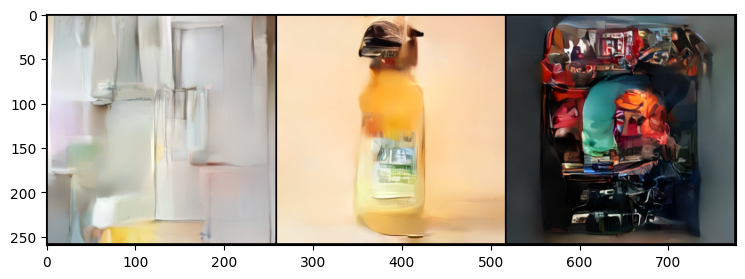

[9.923267611255825e-05]


epoch 14 : loss 0.14475944638252258
A blue Audi car is parked in a showroom with a white floor and a large window on the left side. The car is positioned in the center of the image, and there is a white light shining on it from above. The showroom has a white wall on the right side, and there is a painting of cars on the wall. The floor is clean and the car is the main focus of the image.
A modern white washing machine with a digital display and buttons on the front panel. The machine has a large circular lid with a black rim and a reflective surface. The lid is open, revealing the interior with a black drum and a metal agitator. The machine is set against a plain white background.
A bottle of Shooey's Pale Ale beer with a label featuring a scenic landscape of a house and a clear sky.


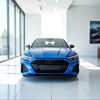

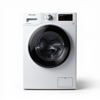

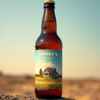

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.20765686..1.2127782].


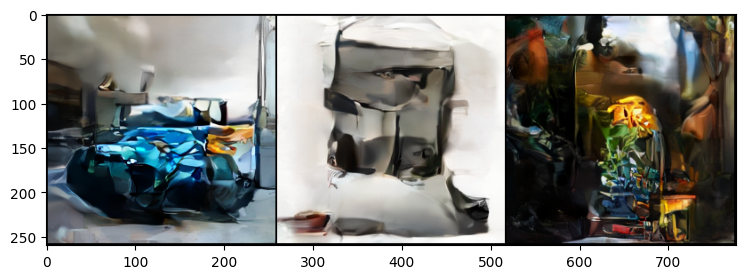

[9.908726641277167e-05]


epoch 15 : loss 0.14367146790027618
A close-up of a single light bulb with a visible filament, hanging from a cord against a dark background. The bulb is illuminated, casting a warm glow and creating a bokeh effect with light spots in the background.
A child's crayon drawing of a bird with a surfboard on its back, flying over a body of water with a cityscape in the background. The bird is surrounded by various elements such as clouds, a sun, and a red cross. The drawing includes text and symbols that appear to be part of the artwork.
A stylized illustration of five interconnected rings, each with a number inside. The rings are arranged in a circular pattern with the numbers increasing clockwise. The numbers are in a bold, white font, and the rings are outlined in a thick, black line. Below the rings, there is a text description in a cursive, white font: 'I-Blue 2-Yellow 3-Red 4-Black 5-Green'.


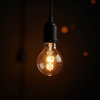

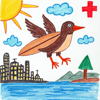

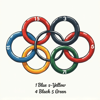

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10150719..1.1377162].


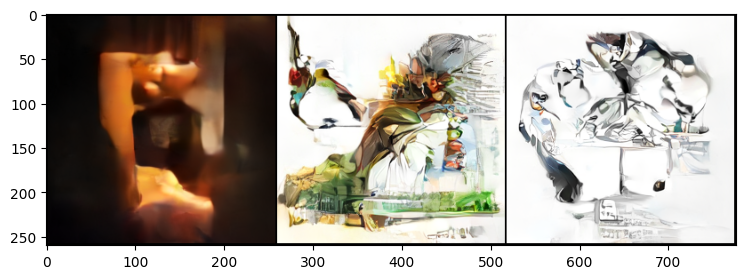

[9.892937348400601e-05]


epoch 16 : loss 0.14353957772254944
Two animated women share an intimate moment amidst a snowy woodland, one in a casual outfit and the other as a fairytale princess.
A man and woman stand on a beach with a 'INCEST FRIENDLY BEACH' signpost behind them, surrounded by white sand, ocean, and a partly cloudy sky.
A wristwatch with a silver case and a black leather strap is displayed on a white background. The watch face shows the time as 10:10 with the hands pointing to the 10 and 2 positions. The watch has a black dial with white hour markers and Roman numerals, and the word 'POLICE' is written at the bottom.


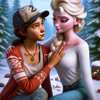

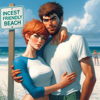

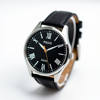

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06641352..1.0922248].


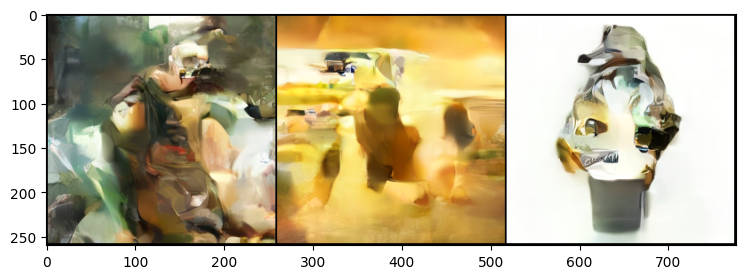

[9.875903747951742e-05]


epoch 17 : loss 0.1424632966518402
Anonymous, t-shirt clad characters, some sporting troll face masks, congregate amidst NYC landmarks under a brooding, nocturnal sky.
A man in a blue shirt is standing next to a large tour bus, which is parked on a wet asphalt surface. The bus has a prominent front windshield and is positioned between two other buses, one on the left and one on the right. The scene appears to be set in a parking lot or bus depot.
A tray of colorful cupcakes with various sprinkles on top is placed on a kitchen counter. The cupcakes are arranged in rows, and each cupcake has a different combination of sprinkles. The tray is made of metal and has a red rim. The lighting in the image is warm, creating a cozy atmosphere.


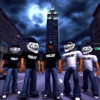

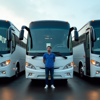

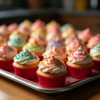

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.089126945..1.16209].


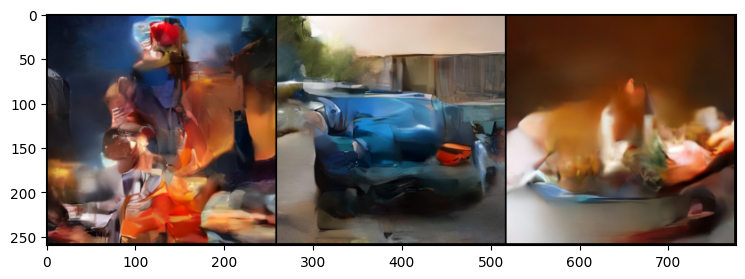

[9.857630171692174e-05]


epoch 18 : loss 0.14109840989112854
A set of six white cotton socks is displayed against a white background. The socks are arranged in a way that the toes are pointing upwards and the heels are pointing downwards. The socks are of a standard length, suitable for everyday wear.
A fusion of Starry Night and a gaming character scene, where Kirby from a video game holds a paintbrush while another Kirby image lies on his palette. The background is a picturesque landscape with mountains and a bright sun.
A small town street scene with a speed limit sign indicating 25 mph. The street is lined with buildings, including a white building with a blue roof and a red building with a blue roof. There is a car parked on the side of the road, and a trash can is visible near the curb. The sky is overcast, and there are power lines above the street.


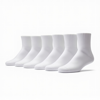

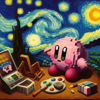

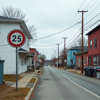

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09275663..1.1602728].


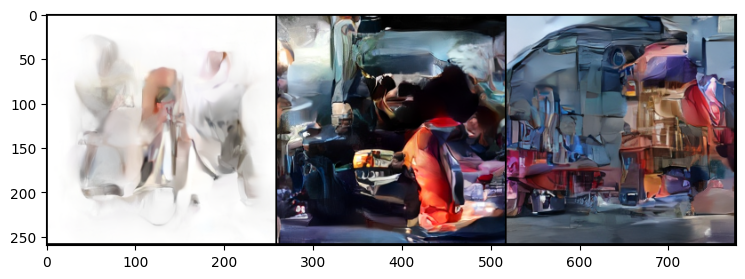

[9.838121266717839e-05]


epoch 19 : loss 0.14351840317249298
A person in a blue shirt is kneeling down and working on a wooden shed. The shed has a red door and is surrounded by a wooden fence. There is a tree in the background, and the scene appears to be during the daytime.
The cover of the documentary film 'Humanity Ascending' featuring a woman with white hair wearing a red top, with a backdrop of Earth and the sun, and text in various languages.
A close-up view of two colorful beaded bracelets displayed on a white surface. The bracelets are made of various beads in shades of green, blue, red, and white, with intricate patterns and designs. The beads are arranged in a way that creates a gradient effect, with the colors transitioning from one to another. The bracelets are placed side by side, and the image is well-lit, highlighting the details of the beads and the textures of the bracelet surfaces.


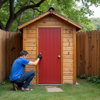

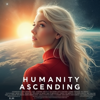

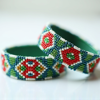

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1036185..1.0927029].


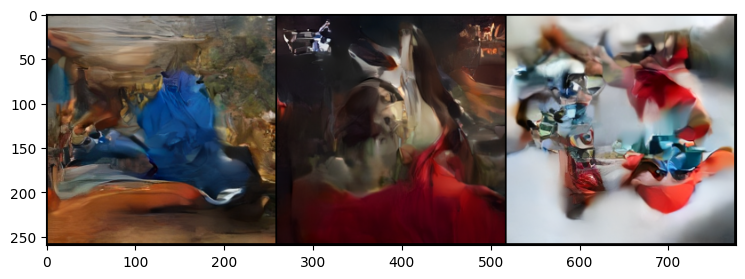

[9.817381994277261e-05]


epoch 20 : loss 0.14207561314105988
An animated female singer stands on a lit stage before an audience, sporting a shimmering short white dress and high heels while holding a mic, amid firework displays overhead.
A row of red brick buildings with white trim and pointed roofs under a clear blue sky. The buildings are lined up along a street with a white line in the middle, and there is a street lamp in the foreground.
A metallic nut with a smooth surface and a central hole is placed on a white background.


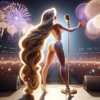

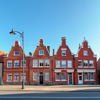

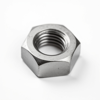

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07225543..1.0774269].


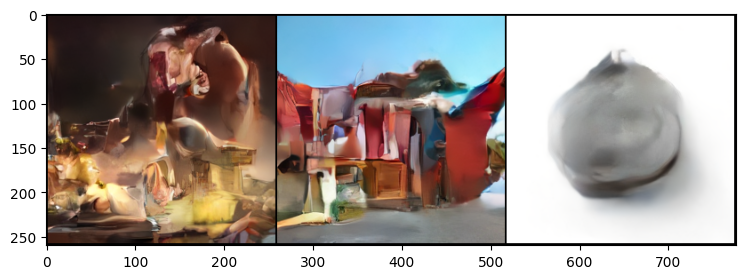

[9.795417628509857e-05]


epoch 21 : loss 0.14142757654190063
An individual in formal attire plays an unspecified game involving bear-shaped tokens at a luxurious casino, amidst ornate surroundings.
A man is seated at a drum set in a room with a world map on the wall. He is wearing a black cap, headphones, and a white t-shirt. The drum set includes a bass drum, snare drum, toms, and cymbals. There is a drumstick in his hand, and he appears to be playing the drums.
A black and white photograph of a large ship under construction in a dry dock. The ship is surrounded by scaffolding and construction equipment. There are several workers on the ship, some of whom are visible on the deck and others on the sides of the ship. The image has a vintage feel, with a focus on the ship's structure and the process of its construction.


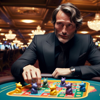

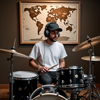

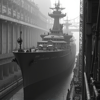

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07624698..1.0936104].


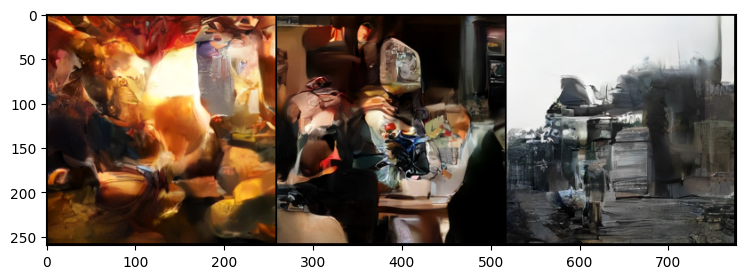

[9.772233755104694e-05]


epoch 22 : loss 0.14118118584156036
A panoramic view of a city skyline at night with a body of water in the foreground. The skyline is illuminated with various building lights, and the sky is dark with a hint of clouds. The water reflects the city lights, creating a mirror-like effect.
A close-up image of a silver coin with a detailed portrait of a person on one side and a figure seated on a chair on the other side. The coin is placed on a blue background.
A large, textured stone is prominently displayed against a wall with a patterned wallpaper. The wall has three electrical outlets, two of which are empty and one with a plug inserted. Below the stone, there is a couch with two white pillows on it. The pillows are positioned in the foreground, with one slightly overlapping the other. The couch is covered with a yellow fabric, and the scene is well-lit, suggesting a daytime setting.


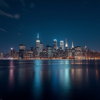

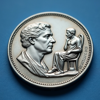

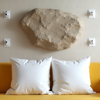

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.15095115..1.1030588].


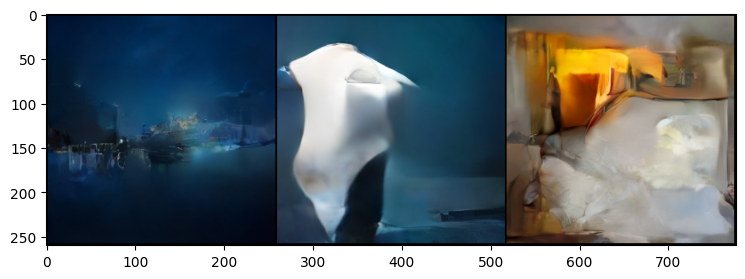

[9.747836269880003e-05]


epoch 23 : loss 0.14001686871051788
A plain, ornate silver mirror with a decorative frame and a reflective surface.
Two Marvel characters face off against a starry cosmos backdrop: a young hero in a green and white suit meets a fierce, villainous figure believed to be Thanos.
An individual donning a large, circular gas mask stands near an indoor entrance, holding a game controller while inside an otherwise monochromatic domestic space, accompanied by a potted plant.


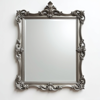

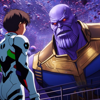

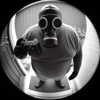

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.086562395..1.0170192].


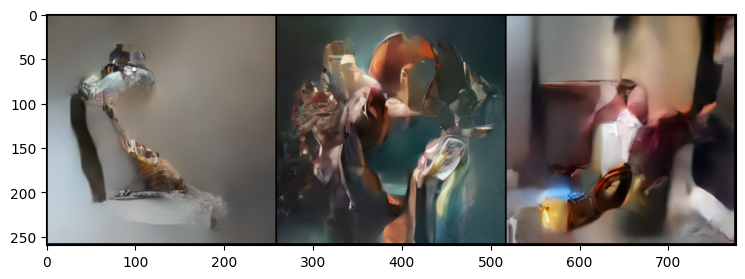

[9.722231377283841e-05]


epoch 24 : loss 0.14106620848178864
A close-up of a French flag with a detailed texture, featuring the iconic red, white, and blue colors. The flag is predominantly white with red stripes at the top and bottom, and a blue stripe in the middle. The texture gives the flag a three-dimensional appearance, with the colors appearing more vibrant and the fabric-like texture adding depth to the image.
A group of young people lie in a muddy field during what appears to be a playful gathering, amid laughter and lightheartedness; a shed can be seen beyond.
A stylized illustration of a medical chart with a large blood pressure monitor on the left side, connected to the chart by a blue line. The chart has multiple sections with text and icons, including a stethoscope icon on the right side. The background is a light blue color with a subtle pattern.


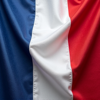

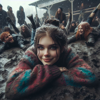

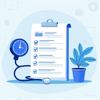

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1316055..1.1177393].


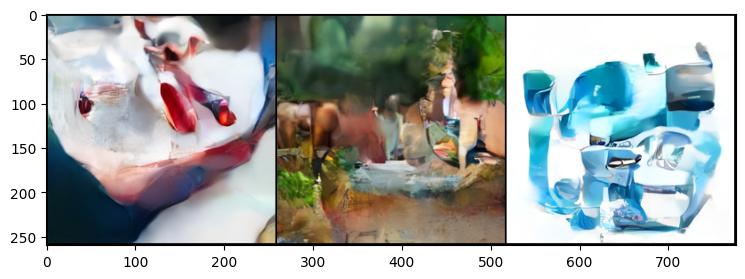

[9.695425588816249e-05]


epoch 25 : loss 0.14065246284008026
A colored pencil drawing of a young girl sitting on a wooden rocking chair, reading a book. She is wearing a black top, denim shorts, and black sandals. The chair is positioned on a wooden floor, and there is a bookshelf with books behind her.
Two versions of Princess Peach from the Super Mario series are depicted, one wearing a pink and gold outfit with a trophy and crown, the other wearing a pink outfit with a crown and an aggressive expression, on a stage with stage lights.
A black and white USB flash drive and a black and white portable hard drive are placed on a wooden surface. A red USB flash drive and a red stylus pen are also present.


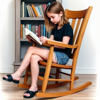

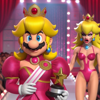

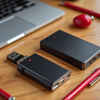

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.19031227..1.2297798].


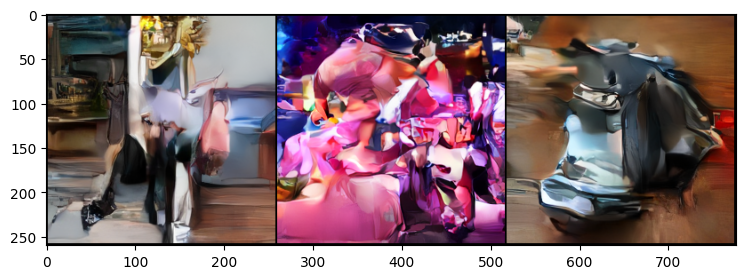

[9.667425721373332e-05]


epoch 26 : loss 0.1407364308834076
A modern sculpture of two intertwined figures stands on a black pedestal against a red background.
A group of people are dancing and laughing together at a party. The woman in the foreground is wearing a black dress with a sparkly pattern and has her arm raised in the air. She is smiling and looking to her left. Behind her, there are four other people: a woman with curly hair wearing a blue dress, a man in a white shirt, a woman with long hair wearing a green dress, and a man in a black shirt. They are all smiling and appear to be enjoying themselves. The background is dark with purple and pink lights, and there is a wooden wall with vertical slats.
A muscular warrior stands on a cliff, wielding a sword and shield under a fiery orange/yellow sky, with flowing hair and a red cape.


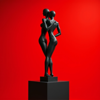

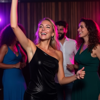

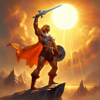

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1253531..1.1835063].


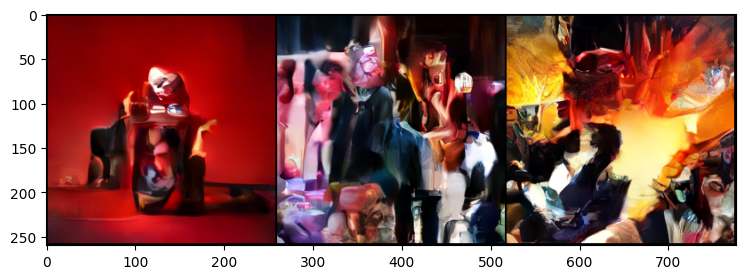

[9.638238895513687e-05]


epoch 27 : loss 0.1402113437652588
A purple fabric with a textured appearance is laid out on a wooden surface. A green ruler with black markings is placed on top of the fabric, measuring the length of the fabric. The ruler has a white line indicating the measurement and a label at the bottom that reads 'WOMEN'S MENS' with a logo.
The first image depicts a surreal landscape with a large, metallic cylinder standing upright in the center, surrounded by lush greenery and clusters of blue grapes. The background features a serene lake with rolling hills and a clear sky with a few clouds. The title 'Slim Fingers Beikon' is prominently displayed at the top, with the author's name 'Arch Merrill' written below it.
A close-up image of a wooden spoon filled with white powder, possibly flour, sugar, or baking powder. The spoon is placed on a surface with some powder scattered around it. The focus is on the texture of the powder and the wooden spoon, with a blurred background.


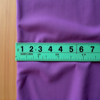

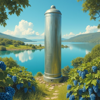

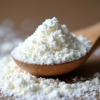

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.043092966..1.04503].


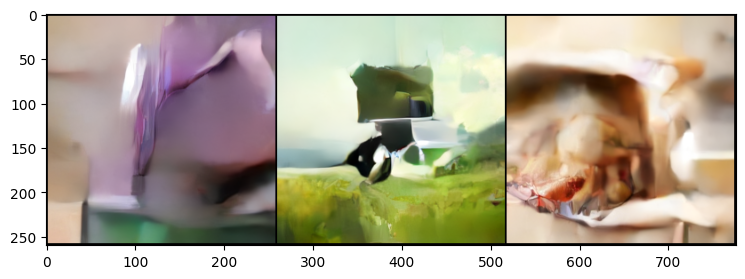

[9.607872533647584e-05]


epoch 28 : loss 0.14100080728530884
Kermit the Frog sits at a desk playing a video game, holding a mouse and a straw, with a computer monitor displaying a retro game and various objects nearby in a cozy room with bookshelves.
An animated figure of a princess stands before a reflective body of water at night, adorned in an elaborate gown and crown beneath a starlit sky illuminated by a full moon.
The second image shows a smartphone screen displaying a system information page with various technical details. The screen is divided into sections with headings such as 'Core Platform', 'Emulator', 'Core Design', and 'Core State'. Below these headings, there are lines of text and numbers that appear to be system information. The screen also has a navigation bar at the bottom with icons for 'Home', 'Gain Control', 'Room Combiner', 'Router', and 'Phone'. The overall color scheme of the screen is blue with some yellow and green accents.


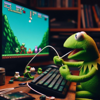

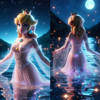

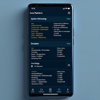

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10758835..1.1319879].


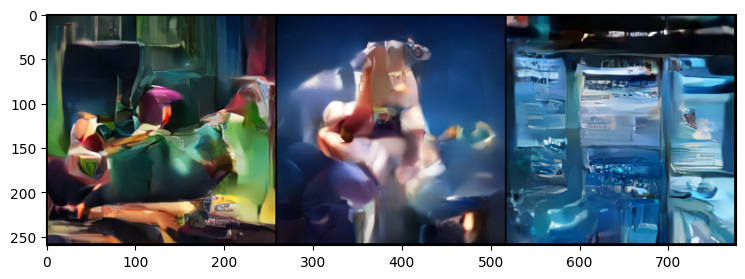

[9.5763343581494e-05]


epoch 29 : loss 0.13997487723827362
Two contrasting animated characters - a female with blonde hair, red headband & scarf, and a male with dark hair donning a distinctive black mask amidst a vividly colored backdrop.
A character with elf-like features, wearing a green tunic and brown belt, stands in front of a window with a blue sky and greenery outside, looking surprised or perplexed.
A closed book with a vintage design on the cover, featuring a woman's face, a hot air balloon, and various gears and mechanical elements. The book is placed on a surface with a marbled pattern, and there is a hand visible at the bottom left corner of the image.


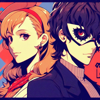

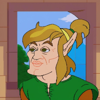

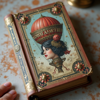

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.15532106..1.2170608].


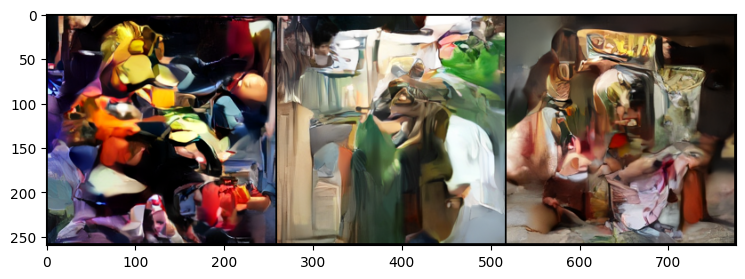

[9.543632389393767e-05]


epoch 30 : loss 0.13979646563529968
A set of three wireless antennas with black bases and two colorful cables is displayed on a white background. The antennas are positioned vertically, with the first antenna on the left, the second in the center, and the third on the right. The cables are coiled and placed in front of the antennas, with the first cable on the left, the second in the center, and the third on the right.
A collection of stick figure illustrations depicting various scenarios, including a doctor and nurse, a patient in a hospital bed, a person in a wheelchair, and a child with a bandaged knee. The figures are in a monochromatic style, with a focus on simple lines and minimal detail.
A man in a Mario costume is submerged underwater amidst scattered coins, interacting with a large fish in the azure waters.


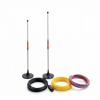

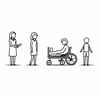

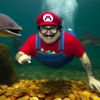

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11989194..1.1225796].


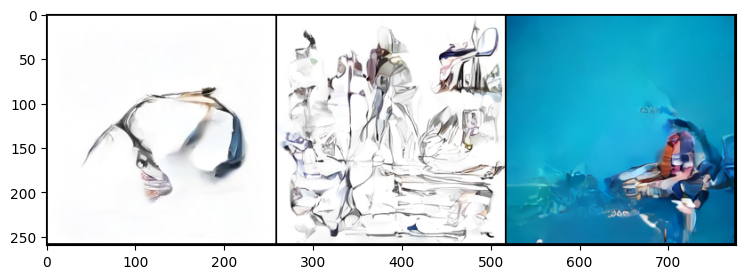

[9.509774943715939e-05]


In [ ]:
loss_history = []

for epoch in range(EPOCHS):
    # Train phase
    model.train()
    epoch_loss = 0.0
    for batch in pb(train_dataloader):
        batch = batch_to_device(batch, device)
        optimizer.zero_grad()
        x = batch['pixel_values']
        text_emb = batch['text_emb'].to(dtype)
        text_attn_mask = batch['text_attn_mask']
        with torch.autocast(device_type="cuda", dtype=amp_dtype, enabled=use_amp):
            z = vae.encode(x).latents * vae.config.scaling_factor
            z_noisy, noise, random_timesteps = add_noise(z, steps=STEPS)  # (bs, ch, h, w), (bs, ch, h, w), (bs,)
            pred_noise = model(
                x=z_noisy.to(dtype),
                t=random_timesteps,
                c=text_emb,
                c_mask=text_attn_mask,
            )  # (bs, ch, h, w)
            loss = torch.nn.functional.mse_loss(pred_noise.cpu().float(), noise.cpu().float())
            if torch.isnan(loss):
                print('loss is nan')
                raise Exception()
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        scheduler.step()
        epoch_loss += loss.cpu().detach()
    loss_history.append(epoch_loss / len(train_dataloader))
    print(f'epoch {epoch} : loss {loss_history[-1]}')

    # Ealuluation Phase
    model.eval()
    random_selected_data = hf_dataset.shuffle().select(range(3))[:]
    texts = [d['prompt'] for d in random_selected_data['json']]
    print('\n'.join(texts))
    display(random_selected_data['jpg'][0].resize((100, 100)))
    display(random_selected_data['jpg'][1].resize((100, 100)))
    display(random_selected_data['jpg'][2].resize((100, 100)))
    gen_img = generate(model, texts=texts)
    gen_img = 0.5 * gen_img + 0.5
    grid_image = torchvision.utils.make_grid(gen_img.cpu(), nrow=3)
    plt.figure(figsize=(3*3, 3))
    plt.imshow(grid_image.float().permute(1, 2, 0))
    plt.show()

    torch.save(model.state_dict(), f'./denoise_model_vaele_tmp.pt')
    print(scheduler.get_lr())

In [ ]:
plt.plot(loss_history)

## 7. Generate Images with Trained Model

In [34]:
%%time
random_selected_data = hf_dataset.shuffle().select(range(4*4))[:]
gen_img = generate(model, texts=[d['prompt'] for d in random_selected_data['json']])

CPU times: user 46.5 s, sys: 3.09 s, total: 49.6 s
Wall time: 49.5 s


In [35]:
gt_images = 0.5 * torch.stack([image_transforms(img) for img in random_selected_data['jpg']], dim=0) + 0.5

In [36]:
gen_img = 0.5 * gen_img + 0.5

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09822905..1.1773257].


A black circular object with a textured surface and a small, circular, metallic object in the center. The object is placed on a white background.
An elaborate, yellow flower with an embedded white rabbit rests amid colorful foliage beneath a radiant, pastel sky.
A woman with red hair and a black-and-red armored outfit, holding an axe and pointing to it in a grand hall decorated with flowers and plants.
A whimsical clown-like character in a blue jacket and red bowtie juggles work and play in an office setting.
A close-up view of a gravel surface with various sizes of stones and pebbles. The gravel is predominantly composed of small, rounded stones with some larger, more angular pieces scattered throughout. The surface appears to be dry and undisturbed, with no visible signs of moisture or recent disturbance.
A Victorian-style living room with a large window draped with heavy, dark grey curtains featuring gold trim and tassels. The room has a dark blue upholstered armchair, a small round

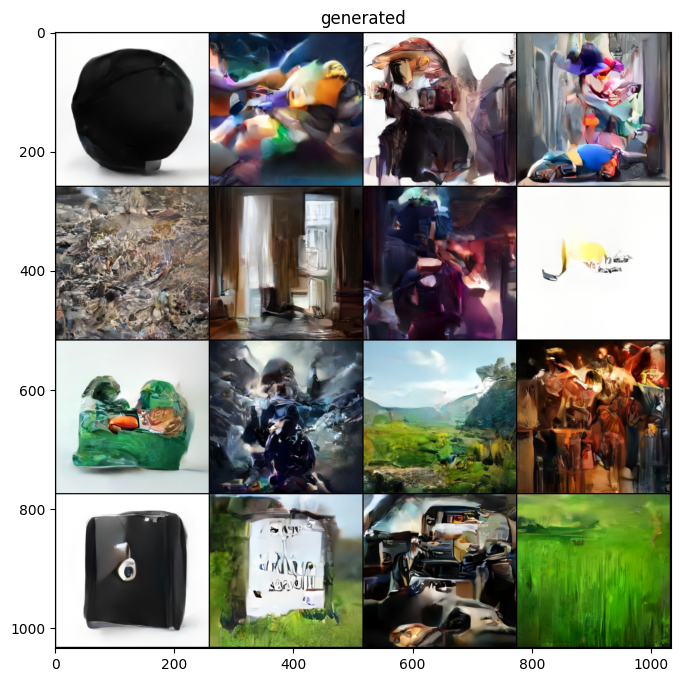

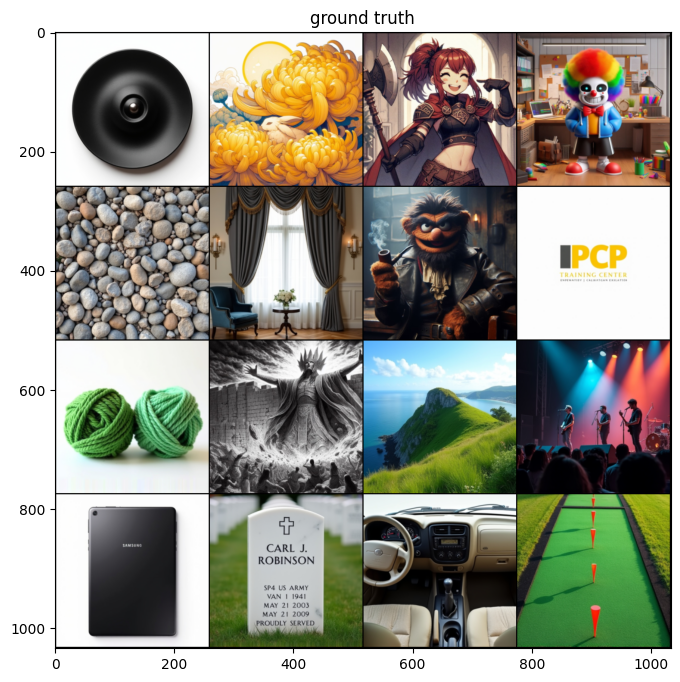

In [37]:
print('\n'.join([d['prompt'] for d in random_selected_data['json']]))

grid_image = torchvision.utils.make_grid(gen_img.cpu(), nrow=4)
plt.figure(figsize=(8, 8))
plt.imshow(grid_image.permute(1, 2, 0))
plt.title('generated')
plt.show()

grid_gt_image = torchvision.utils.make_grid(gt_images.cpu(), nrow=4)
plt.figure(figsize=(8, 8))
plt.imshow(grid_gt_image.permute(1, 2, 0))
plt.title('ground truth')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.18066502..1.1516185].


A stylized illustration of a person with a large head and a small body, represented by a black circle and a black rectangle respectively. The person is connected to three rectangular blocks with lines, suggesting a connection or interaction. The blocks are labeled '1', '2', and '3' in a white font. The image has a monochromatic black and white color scheme.
A man in a military uniform is standing on a street, observing a construction site where a large crane is lifting a fallen tree trunk. There are other workers in orange vests and hard hats around the site, and a car is parked nearby. The scene appears to be set in a residential area with houses in the background.
A vibrant, ornate building with a pointed roof and intricate decorations is illuminated by warm lights at night. The building is surrounded by a decorative metal fence with statues and a person is visible walking on the sidewalk.
The second image shows the same stylized logo for 'Re Feel' with the same ornate design element

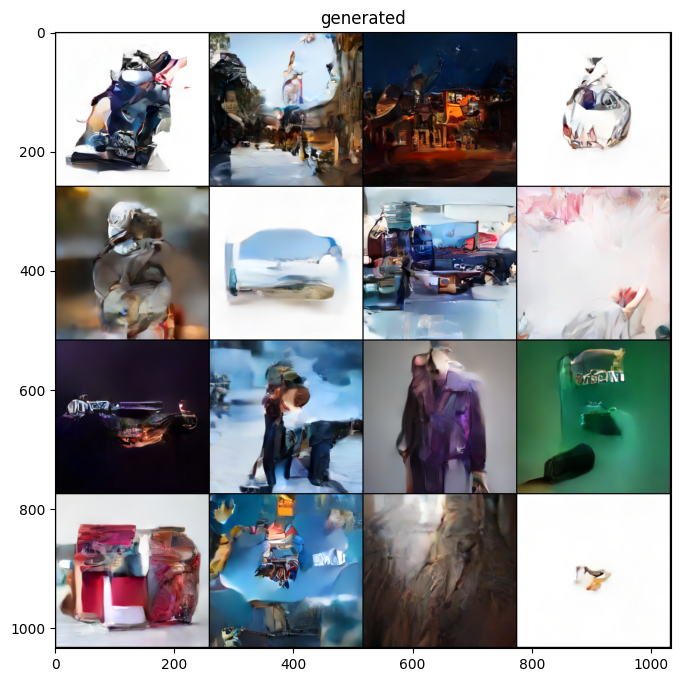

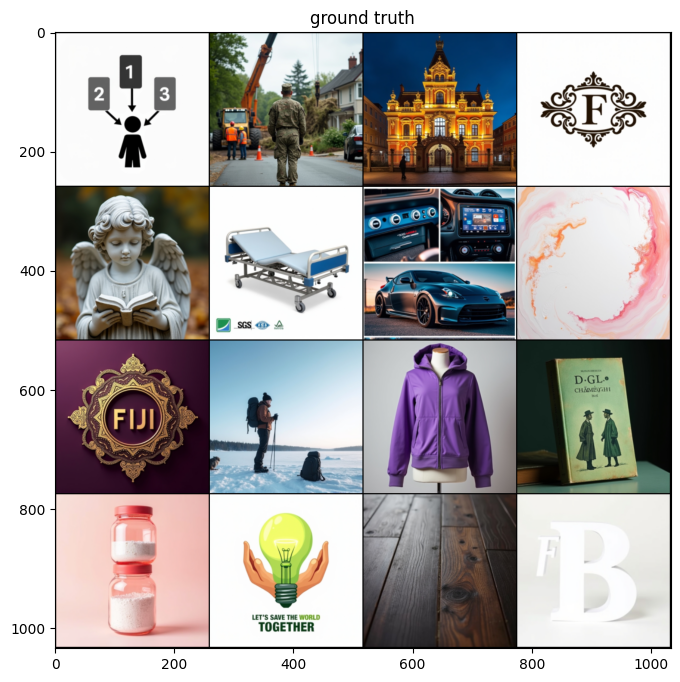

In [35]:
print('\n'.join([d['prompt'] for d in random_selected_data['json']]))

grid_image = torchvision.utils.make_grid(gen_img.cpu(), nrow=4)
plt.figure(figsize=(8, 8))
plt.imshow(grid_image.permute(1, 2, 0))
plt.title('generated')
plt.show()

grid_gt_image = torchvision.utils.make_grid(gt_images.cpu(), nrow=4)
plt.figure(figsize=(8, 8))
plt.imshow(grid_gt_image.permute(1, 2, 0))
plt.title('ground truth')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.16814613..1.3915806].


A white background with a stylized black and blue logo featuring the word 'Ketto' and a bird silhouette. The logo is centered on the image.
A black and white image of a man playing a trumpet. He is wearing a white suit with a black tie and a white shirt. The man has glasses and is holding the trumpet with his left hand and his right hand is resting on the bell of the instrument. The background is dark, and the image has a vintage feel.
A plain, sleeveless, v-neck top made of a smooth, light beige fabric. The top has a simple design with a straight silhouette and a zipper closure at the front. It is presented against a white background.
A white ceramic vase with a textured surface and a red candlestick inside it, placed on a white surface. A single red rose with green leaves is lying next to the vase.
A silver car is parked on the street.
The second image is a collage of various advertisements and promotional materials for a fictional brand called 'Parco'. The top left corner features a

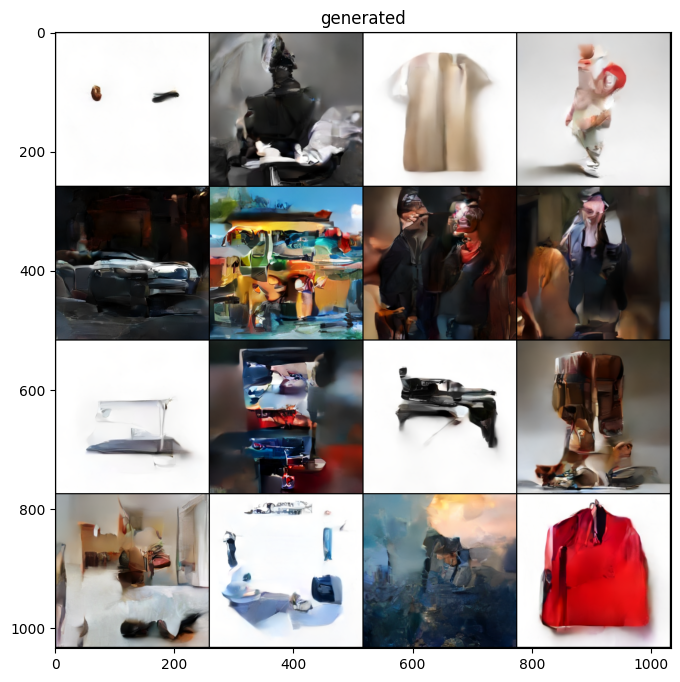

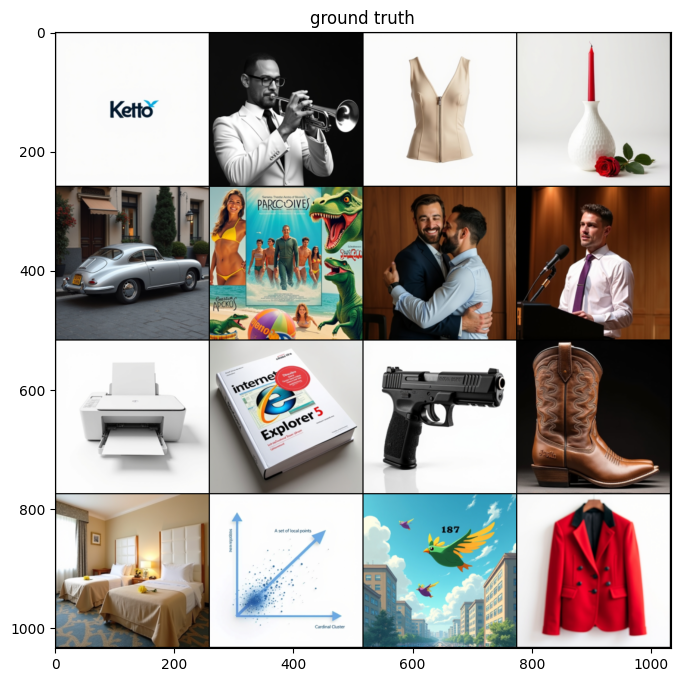

In [37]:
print('\n'.join([d['prompt'] for d in random_selected_data['json']]))

grid_image = torchvision.utils.make_grid(gen_img.cpu(), nrow=4)
plt.figure(figsize=(8, 8))
plt.imshow(grid_image.permute(1, 2, 0))
plt.title('generated')
plt.show()

grid_gt_image = torchvision.utils.make_grid(gt_images.cpu(), nrow=4)
plt.figure(figsize=(8, 8))
plt.imshow(grid_gt_image.permute(1, 2, 0))
plt.title('ground truth')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1311987..1.1577144].


A modern lamp with a white shade and a black stand is turned on, casting a soft glow on the wall behind it. The lamp is placed on a tiled floor, and the wall is painted in a light color.
A collage of four images showcasing a Jewish noodle kugel recipe. The top left image displays a dish with noodles and a brown topping, the top right shows a pot with noodles and a yellow sauce, the bottom left shows a dish with noodles and a white topping, and the bottom right shows a pot with noodles and a brown sauce. The images are arranged in a square format with the words 'Comfort Food Jewish Noodle Kugel Recipe' at the top.
A modern, round, black sink with a metallic drain sits on a wooden countertop.
A woman with short hair wearing a floral dress is standing in front of a cactus plant.
A white sports car with a black stripe is parked on a street with a cityscape in the background. The car has a large rear wing and is adorned with various sponsor decals. The cityscape includes industrial building

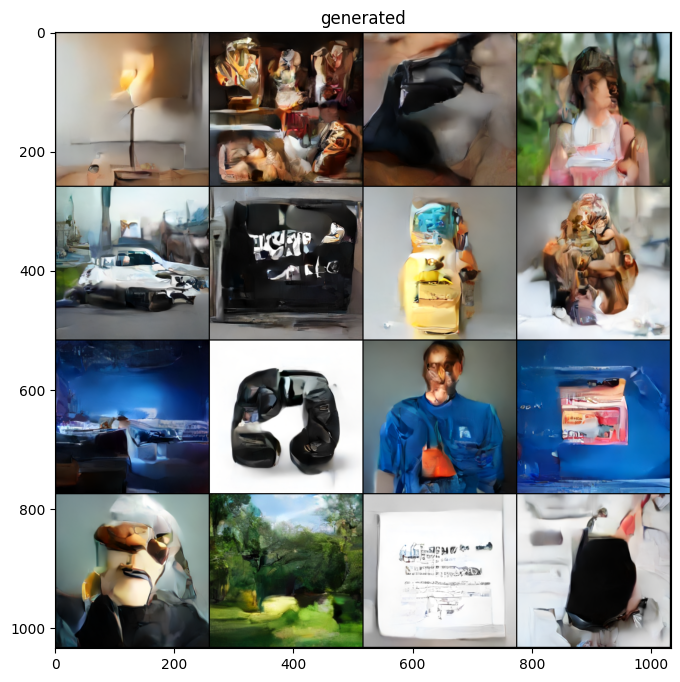

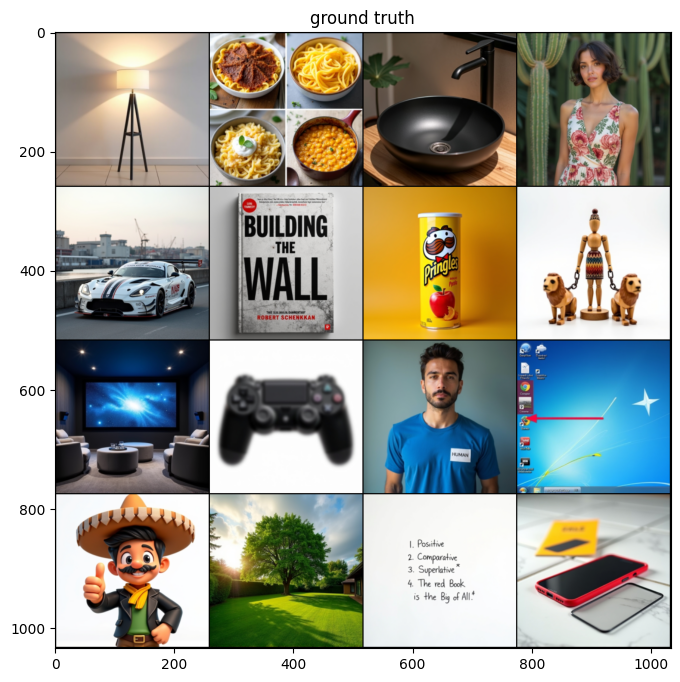

In [36]:
print('\n'.join([d['prompt'] for d in random_selected_data['json']]))

grid_image = torchvision.utils.make_grid(gen_img.cpu(), nrow=4)
plt.figure(figsize=(8, 8))
plt.imshow(grid_image.permute(1, 2, 0))
plt.title('generated')
plt.show()

grid_gt_image = torchvision.utils.make_grid(gt_images.cpu(), nrow=4)
plt.figure(figsize=(8, 8))
plt.imshow(grid_gt_image.permute(1, 2, 0))
plt.title('ground truth')
plt.show()